In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from helpermodules.clustering_class import TimeSeriesClustering, plot_cluster_timeseries

# Load dataframe

In [2]:
# Load the cleaned S&P 500 DataFrame from a pickle file
import pandas as pd
import pickle
with open('data/pickle_files/cleaned_sp500_daily.pkl', 'rb') as file:
    df_sp500 = pickle.load(file)
    
# Fill any missing values by forward-filling and then backward-filling
df_sp500.fillna(method='ffill', inplace=True)  # Forward-fill for existing gaps
df_sp500.fillna(method='bfill', inplace=True)  # Backward-fill for leading gaps
df_sp500

C:\Users\giuli\AppData\Local\Temp\ipykernel_15260\2178412517.py:8: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_sp500.fillna(method='ffill', inplace=True)  # Forward-fill for existing gaps
C:\Users\giuli\AppData\Local\Temp\ipykernel_15260\2178412517.py:9: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_sp500.fillna(method='bfill', inplace=True)  # Backward-fill for leading gaps


Ticker,TSLA,MLM,POOL,PAYX,JCI,GPC,CAH,AJG,DLTR,HOLX,...,RCL,PRU,GRMN,HAS,ESS,NUE,JBHT,AMAT,ACGL,PYPL
Date,,,,,,,,,,,,,,,,,,,,,
2014-10-14 00:00:00+00:00,15.137333,98.845337,47.631180,31.855057,29.054077,65.548637,56.079235,36.220329,55.880001,23.920000,...,50.171078,52.597412,37.061481,39.956547,137.822662,38.207870,66.783379,16.996983,18.316668,36.709999
2014-10-15 00:00:00+00:00,15.313333,100.631470,47.970528,31.496561,28.512375,65.820229,55.064140,36.089497,55.240002,23.360001,...,48.691025,51.030968,37.849709,39.592178,138.176483,38.254654,66.946983,17.076080,17.916668,36.709999
2014-10-16 00:00:00+00:00,15.090000,104.286591,51.328083,31.525818,28.497742,66.423729,54.236980,35.885101,55.049999,23.150000,...,49.949516,51.660164,38.397095,39.504738,138.235413,38.628853,67.919609,17.462774,17.766666,36.709999
2014-10-17 00:00:00+00:00,15.165333,108.374489,50.801243,31.825790,29.420084,66.800919,55.357380,36.481945,56.580002,23.860001,...,51.145958,53.128288,38.127060,39.242382,137.630951,38.909504,68.092300,17.471556,18.123333,36.709999
2014-10-20 00:00:00+00:00,15.364667,110.114586,51.337040,32.008709,29.398130,67.472343,55.725842,36.694550,57.340000,24.010000,...,54.265591,53.088989,38.550365,41.180832,139.798157,39.353878,68.046844,17.638535,18.240000,36.709999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-07 00:00:00+00:00,240.830002,518.650024,363.019989,136.533539,75.550003,134.990005,111.760002,286.899994,69.459999,79.879997,...,179.789993,120.459999,163.130005,72.489998,287.910004,152.750000,163.845398,200.130005,107.790001,80.260002
2024-10-08 00:00:00+00:00,244.500000,523.989990,364.940002,137.248795,76.349998,133.669998,112.620003,293.160004,69.480003,80.260002,...,183.389999,120.879997,164.630005,72.110001,288.480011,148.110001,164.902985,200.880005,109.910004,81.160004
2024-10-09 00:00:00+00:00,241.050003,531.159973,365.739990,138.917709,77.699997,133.759995,114.540001,294.940002,69.629997,80.120003,...,193.029999,122.120003,165.309998,72.239998,288.190002,151.820007,165.711136,205.059998,113.089996,81.650002


In [3]:
df = df_sp500.T.copy()

# Clustering Class

In [4]:
# Initialize the DTWClustering with the sliced DataFrame
clustering = TimeSeriesClustering(df)
clustering.preprocess(method='pct_change')



# Apply DTW-Hierarchical


Hierarchical Clustering Results with FastDTW Distance:
Loading FastDTW distance matrix from file...
Plotting dendrogram...


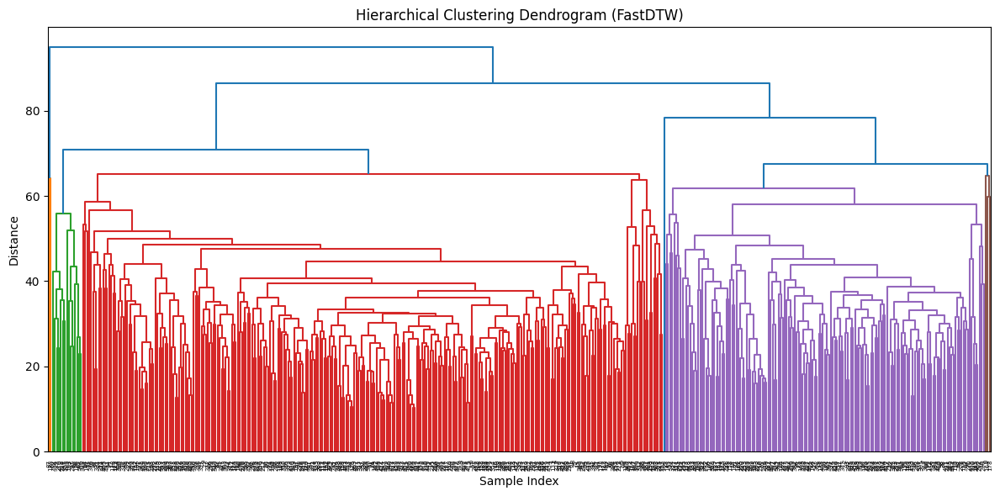

Silhouette Score: 0.2993
Number of Clusters: 4
[2 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 3 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0
 0 0 0 2 0 0 0 0 0 0 2 0 1 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 2 0 0 0 0 0 0 2 0 0 0 2 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0]


c:\Users\giuli\Repositories\dtwclustering_sp500\helpermodules\clustering_class.py:143: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z = linkage(distance_matrix, method=linkage_method)


In [5]:
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import squareform

# Select number of clusters based on dendrogram
number_of_clusters = 4 # Adjust this manually

print("\nHierarchical Clustering Results with FastDTW Distance:")
# Compute or load the FastDTW distance matrix and populate the cache
if os.path.exists("fastdtw_distance_matrix.npy"):
    print("Loading FastDTW distance matrix from file...")
    distance_matrix = np.load("fastdtw_distance_matrix.npy")

    cache_key = f"fastdtw_{hash(frozenset({}.items()))}"
    clustering.distance_matrices[cache_key] = distance_matrix
else:  
    print("Computing FastDTW distance matrix and saving to file...")
    hierarchical_dtw = clustering.hierarchical_clustering(
        n_clusters=number_of_clusters,
        metric='fastdtw',
        linkage_method='complete'
    )
cache_key = f"fastdtw_{hash(frozenset({}.items()))}"
distance_matrix = clustering.distance_matrices[cache_key]
np.save("fastdtw_distance_matrix_radius5.npy", distance_matrix)

# Plot dendrogram before clustering
print("Plotting dendrogram...")
condensed_distance = squareform(distance_matrix, checks=False)
linkage_matrix = linkage(condensed_distance, method='complete')
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix)
plt.title("Hierarchical Clustering Dendrogram (FastDTW)")
plt.xlabel("Sample Index")
plt.ylabel("Distance")
plt.tight_layout()
plt.show()

# Now perform clustering using the cached distance matrix
hierarchical_dtw = clustering.hierarchical_clustering(
    n_clusters=number_of_clusters,
    metric='fastdtw',
    linkage_method='complete'
)

# Print results
dtw_clusters = hierarchical_dtw['clusters'] - 1
dtw_silhouette = hierarchical_dtw['silhouette_score']
print(f"Silhouette Score: {dtw_silhouette:.4f}")
print(f"Number of Clusters: {hierarchical_dtw['n_clusters']}")
print(dtw_clusters)


In [6]:
from scipy.cluster.hierarchy import cophenet
c, _ = cophenet(linkage_matrix, condensed_distance)
print(f"Cophenetic Correlation Coefficient: {c:.4f}")


Cophenetic Correlation Coefficient: 0.3412


# Apply K-means Euclidean

c:\Users\giuli\Repositories\dtwclustering_sp500\venv\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] The system cannot find the file specified
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "c:\Users\giuli\Repositories\dtwclustering_sp500\venv\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\Users\giuli\AppData\Local\Programs\Python\Python312\Lib\subprocess.py", line 550, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\giuli\AppData\Local\Programs\Python\Python312\Lib\subprocess.py", line 1028, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File

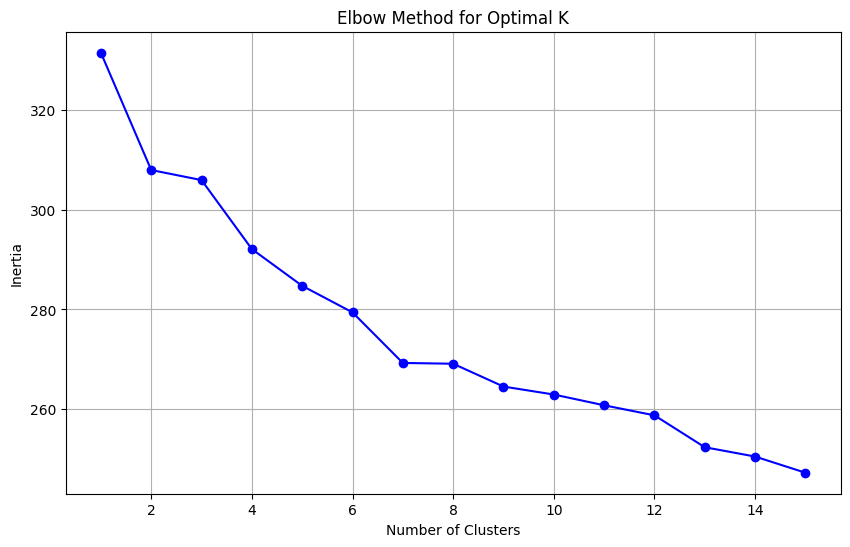

In [7]:
#elbow method for kmeans clustering
clustering.kmeans_clustering(n_clusters=3)
clustering.plot_elbow(max_clusters=15)

In [8]:
# KMeans Clustering with Euclidean Distance
print("\nKMeans Clustering with Euclidean Distance:")
kmeans_euclidean = clustering.kmeans_clustering(
    n_clusters=3, init='k-means++', n_init=10
)
# results
kmeans_clusters = kmeans_euclidean['clusters']
kmeans_silhouette = kmeans_euclidean['silhouette_score']
print(f"Silhouette Score: {kmeans_silhouette:.4f}")
print(f"Number of Clusters: {kmeans_euclidean['n_clusters']}")
print(kmeans_clusters)




KMeans Clustering with Euclidean Distance:
Silhouette Score: 0.0869
Number of Clusters: 3
[1 2 0 0 0 0 0 0 0 0 1 2 2 0 0 0 0 2 2 0 2 2 0 2 2 1 2 0 1 2 0 0 2 2 2 0 2
 2 0 0 2 0 2 0 0 0 0 0 1 2 2 0 0 1 1 2 2 0 0 0 0 0 0 2 1 0 0 2 2 0 0 2 0 2
 0 2 0 0 0 2 2 0 1 0 0 2 0 1 1 2 0 2 2 0 0 0 0 1 0 2 2 2 1 2 2 2 0 2 0 0 0
 0 0 1 2 1 0 2 0 2 0 2 2 1 0 2 0 2 2 1 0 2 2 1 2 0 0 1 1 0 1 0 2 1 1 1 0 0
 0 0 0 0 0 0 2 0 0 0 2 0 0 0 2 2 1 2 0 0 0 0 1 1 0 0 0 1 2 1 2 2 0 1 2 1 0
 2 0 0 0 0 1 0 0 2 1 2 0 0 2 2 1 0 2 0 2 2 0 0 1 2 2 2 2 2 2 2 2 0 0 2 2 1
 2 0 2 2 0 0 0 0 0 0 2 2 2 0 2 1 2 0 2 2 0 0 0 1 0 0 0 1 2 2 0 0 0 2 2 2 2
 0 2 0 2 2 0 2 0 2 0 1 1 2 2 0 2 0 0 0 2 0 0 0 0 0 0 2 0 0 0 1 0 0 0 0 1 1
 2 2 0 0 2 2 0 0 0 0 2 0 2 2 2 0 2 1 2 0 0 0 0 0 1 2 1 2 0 2 2 0 0 0 0 0 2
 0 1 1 2 0 2 0 0 0 0 2 0 1 0 0 0 1 2 2 2 2 0 2 2 0 1 2 1 0 0 0 0 0 0 2 0 2
 0 0 0 0 0 0 1 0 0 2 2 2 2 0 1 0 0 2 0 2 2 2 2 0 2 0 0 0 2 0 1 1 0 0 1 2 0
 2 0 0 0 0 0 2 2 0 0 2 2 0 0 0 0 0 0 0 0 0 1 2 0 2 0 2 2 2 0 0 1 0 0 0 0 0
 0 0 0 0 

# Analyse results of both clustering methods

In [9]:

# Analyze clusters for both hierarchical methods
print("\nCluster Analysis for Euclidean Hierarchical Clustering:")
euclidean_analysis = clustering.analyze_clusters(kmeans_euclidean['clusters'])
print(euclidean_analysis)

print("\nCluster Analysis for FastDTW Hierarchical Clustering:")
fastdtw_analysis = clustering.analyze_clusters(hierarchical_dtw['clusters'])
print(fastdtw_analysis)


Cluster Analysis for Euclidean Hierarchical Clustering:
         size  mean_return  volatility  total_return
cluster                                             
0         244     0.000600    0.012682      2.844667
1          66     0.001066    0.018040     13.014381
2         159     0.000574    0.015923      1.740039

Cluster Analysis for FastDTW Hierarchical Clustering:
         size  mean_return  volatility  total_return
cluster                                             
1         443     0.000636    0.014592      3.096884
2           2     0.001559    0.022968     31.510126
3          23     0.000906    0.023953     16.787884
4           1     0.002197         NaN      8.652964


In [10]:
# Prepare actual and percentage change DataFrames
df_actual = df
df_actual_new = df_actual.iloc[:, 1:]  # Drop the first column (timestamp)

df_pct = df_actual.pct_change(axis=1)
df_pct.dropna(axis=1, inplace=True)

# Transpose clusters for better readability (needed for later use)
kmeans_clusters_transposed = kmeans_clusters.T
dtw_clusters_transposed = dtw_clusters.T

# Create a DataFrame to store cluster assignments
clustering_columns = pd.DataFrame({
    'kmeans': kmeans_clusters,
    'dtw': dtw_clusters,
})

# Merge cluster assignments into the actual values DataFrame
df_actual_new['kmeans'] = kmeans_clusters
df_actual_new['dtw'] = dtw_clusters

# Merge cluster assignments into the percentage change DataFrame
df_pct['kmeans'] = kmeans_clusters
df_pct['dtw'] = dtw_clusters



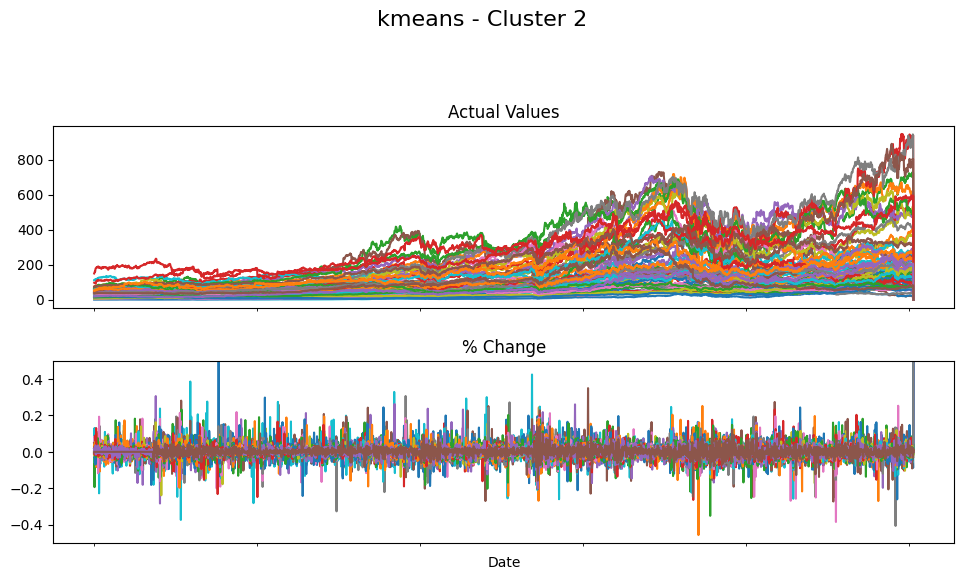

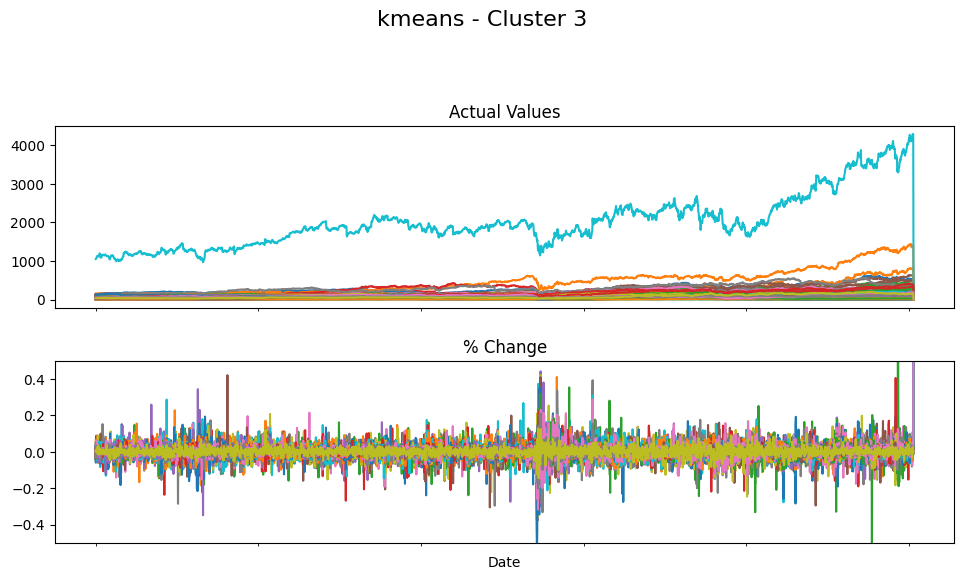

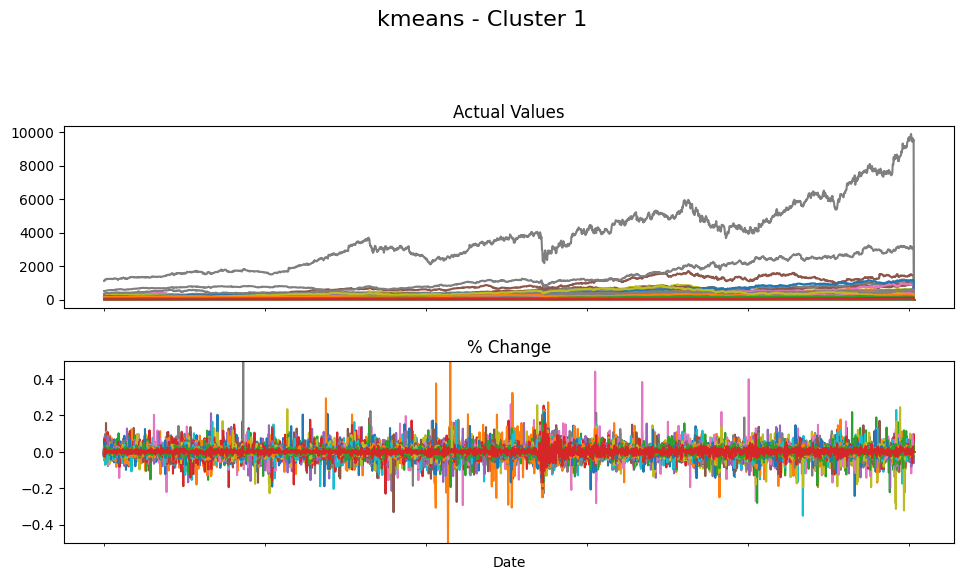

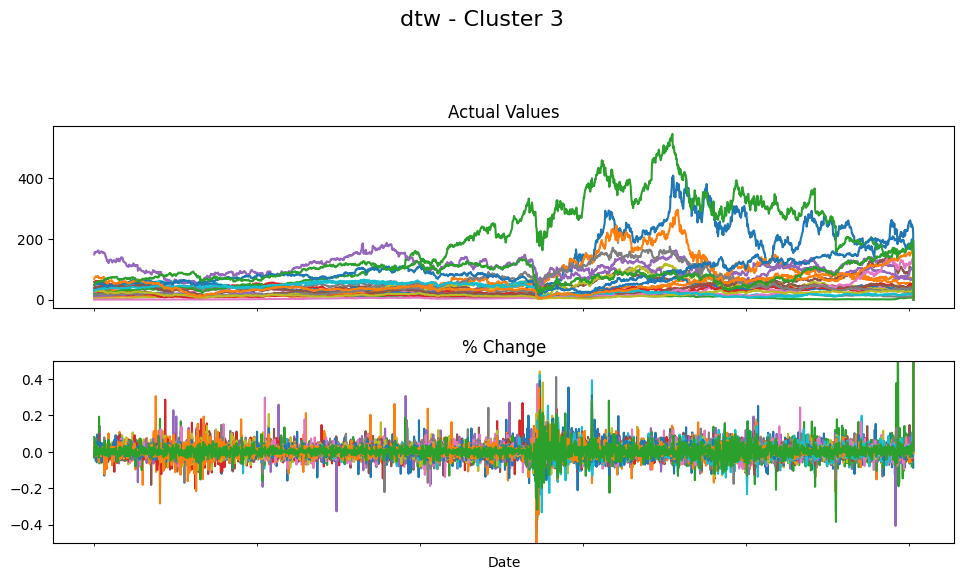

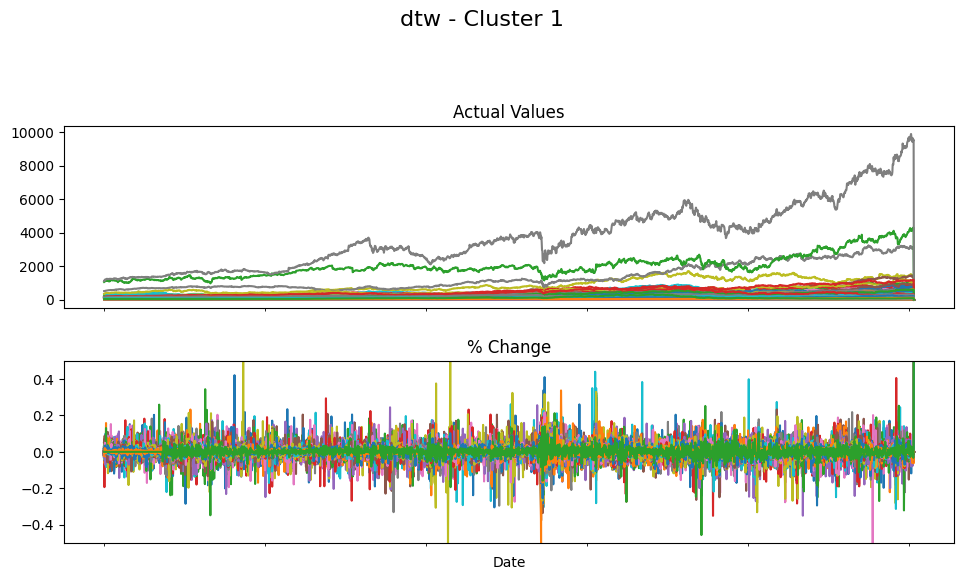

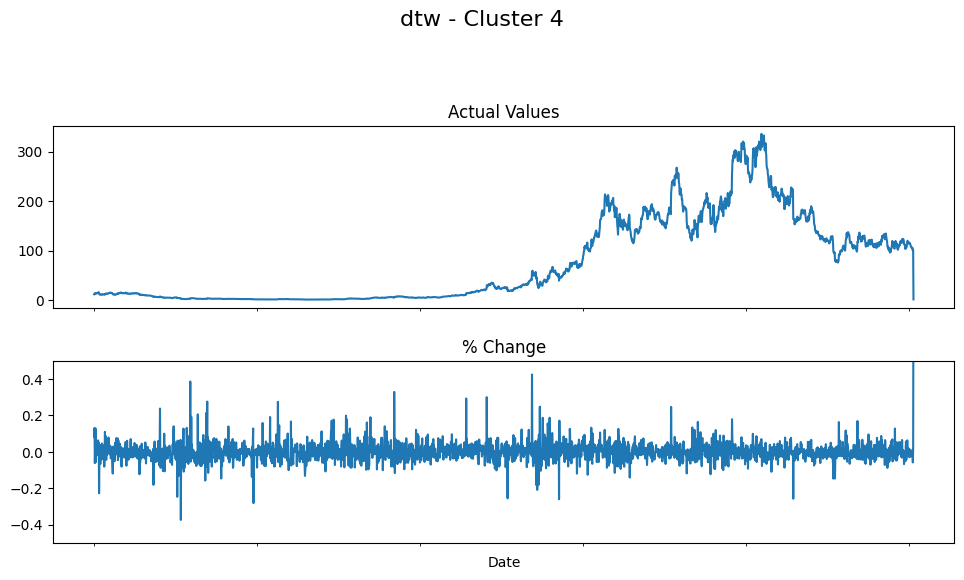

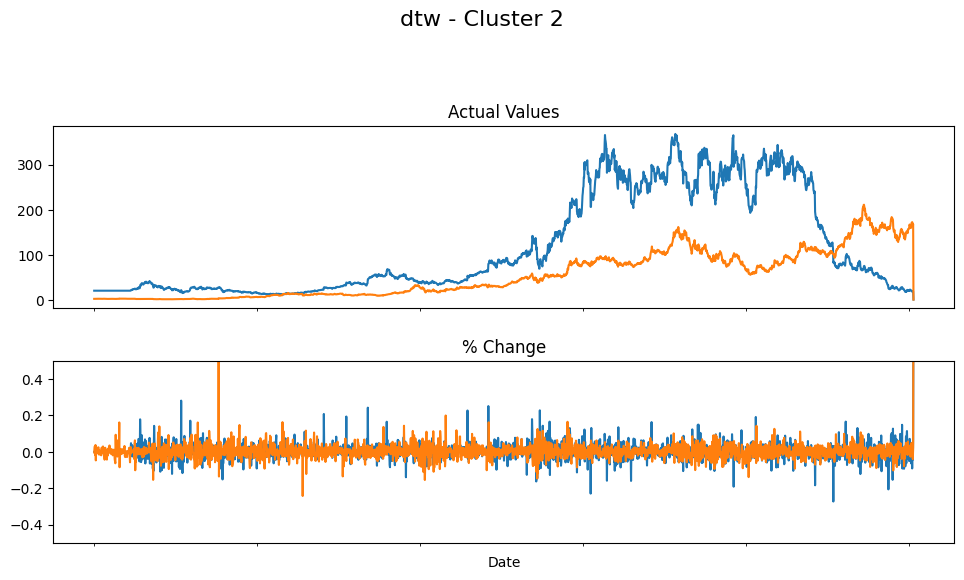

In [11]:

plot_cluster_timeseries(df_actual_new, df_pct, clustering_columns)



In [12]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from fastdtw import fastdtw
from scipy.spatial.distance import euclidean
import seaborn as sns

def visualize_time_series_clusters(df_actual, df_pct, clustering_columns, pct_change_cutoff=1.0):
    """
    Visualizes clustered time series data using:
    - Time series plots of actual and % change
    - PCA & t-SNE scatter plots
    - DTW alignment
    - Distance matrix heatmap
    - Polar (radial) plot
    - PCA explained variance

    Args:
    - df_actual (pd.DataFrame): Actual values (tickers x timestamps + cluster column).
    - df_pct (pd.DataFrame): Percentage change values (tickers x timestamps + cluster column).
    - clustering_columns (list): Column names indicating clustering assignments.
    - pct_change_cutoff (float): Fraction of the percentage change data to keep. 1.0 keeps full data.

    Returns:
    - None
    """
    
    for clustering_col in clustering_columns:
        clusters = df_actual[clustering_col].unique()

        for cluster in clusters:
            tickers_in_cluster = df_actual[df_actual[clustering_col] == cluster].index

            df_cluster_actual = df_actual.loc[tickers_in_cluster].drop(columns=clustering_columns)
            df_cluster_pct = df_pct.loc[tickers_in_cluster].drop(columns=clustering_columns)

            # Optional cutoff for % change data
            if pct_change_cutoff < 1.0:
                cutoff_index = int(len(df_cluster_pct.columns) * pct_change_cutoff)
                df_cluster_pct = df_cluster_pct.iloc[:, :cutoff_index]

            # ---- Plotting ----
            fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(20, 20), sharex=True)
            fig.suptitle(f"{clustering_col} - Cluster {cluster + 1}", fontsize=18)

            # 1. Actual values plot
            if not df_cluster_actual.empty:
                df_cluster_actual.transpose().plot(ax=axes[0], legend=False)
                axes[0].set_title("Actual Values")
                axes[0].set_ylabel('Value')
                

            # 2. % Change plot
            if not df_cluster_pct.empty:
                df_cluster_pct.transpose().plot(ax=axes[1], legend=False)
                axes[1].set_title("% Change")
                axes[1].set_ylim(-0.5, 0.5)
                axes[1].set_ylabel('Pct Change')
                axes[1].set_xticks([])
                axes[1].set_xticklabels([])

            plt.tight_layout(pad=3.0, rect=[0, 0, 1, 0.95])
            plt.show()

            # 3. PCA Pairwise Plot
            try:
                pca = PCA(n_components=2)
                pca_components = pca.fit_transform(df_cluster_actual.transpose())
                plt.scatter(pca_components[:, 0], pca_components[:, 1], c=[cluster] * len(pca_components), cmap='viridis')
                plt.colorbar(label='Cluster')
                plt.title(f"Cluster {cluster + 1} - PCA Visualization")
                plt.xlabel("PC1")
                plt.ylabel("PC2")
                plt.show()
            except:
                print(f"⚠️ PCA failed for cluster {cluster + 1} due to insufficient data.")

            # 4. Distance Matrix Heatmap
            try:
                distance_matrix = np.array([
                    [euclidean(df_cluster_actual.iloc[i].values, df_cluster_actual.iloc[j].values) 
                     for j in range(len(df_cluster_actual))] 
                    for i in range(len(df_cluster_actual))
                ])
                sns.heatmap(distance_matrix, cmap='viridis', square=True)
                plt.title(f"Cluster {cluster + 1} - Distance Matrix Heatmap")
                plt.show()
            except:
                print(f"⚠️ Distance matrix computation failed for cluster {cluster + 1}")

            # 5. DTW Alignment Plot (first two series)
            if len(df_cluster_actual) > 1:
                try:
                    series1 = df_cluster_actual.iloc[0].values.astype(float).flatten()
                    series2 = df_cluster_actual.iloc[1].values.astype(float).flatten()
                    distance, path = fastdtw(series1, series2, dist=euclidean)
                    aligned_series1 = [series1[i] for i, j in path]
                    aligned_series2 = [series2[j] for i, j in path]
                    plt.plot(aligned_series1, label="Aligned Series 1")
                    plt.plot(aligned_series2, label="Aligned Series 2")
                    plt.legend()
                    plt.title(f"Cluster {cluster + 1} - DTW Alignment")
                    plt.show()
                except:
                    print(f"⚠️ DTW failed for cluster {cluster + 1}")

            # 6. Radial (Polar) Plot
            def radial_plot(time_series):
                theta = np.linspace(0, 2 * np.pi, len(time_series), endpoint=False)
                plt.subplot(111, projection='polar')
                plt.plot(theta, time_series)
                plt.title("Radial Plot")
                plt.show()

            if not df_cluster_actual.empty:
                radial_plot(df_cluster_actual.iloc[0].values.astype(float).flatten())

            # 7. t-SNE Visualization
            try:
                tsne = TSNE(n_components=2, perplexity=5)
                tsne_components = tsne.fit_transform(df_cluster_actual.transpose())
                plt.scatter(tsne_components[:, 0], tsne_components[:, 1], c=[cluster] * len(tsne_components), cmap='viridis')
                plt.colorbar(label='Cluster')
                plt.title(f"Cluster {cluster + 1} - t-SNE Visualization")
                plt.show()
            except:
                print(f"⚠️ t-SNE failed for cluster {cluster + 1}")

            # 8. PCA Explained Variance
            try:
                pca = PCA()
                pca.fit(df_cluster_actual.transpose())
                explained_variance = pca.explained_variance_ratio_
                plt.plot(range(1, len(explained_variance)+1), np.cumsum(explained_variance))
                plt.title(f"Cluster {cluster + 1} - Cumulative Explained Variance")
                plt.xlabel("Number of Components")
                plt.ylabel("Cumulative Explained Variance")
                plt.show()
            except:
                print(f"⚠️ PCA explained variance failed for cluster {cluster + 1}")


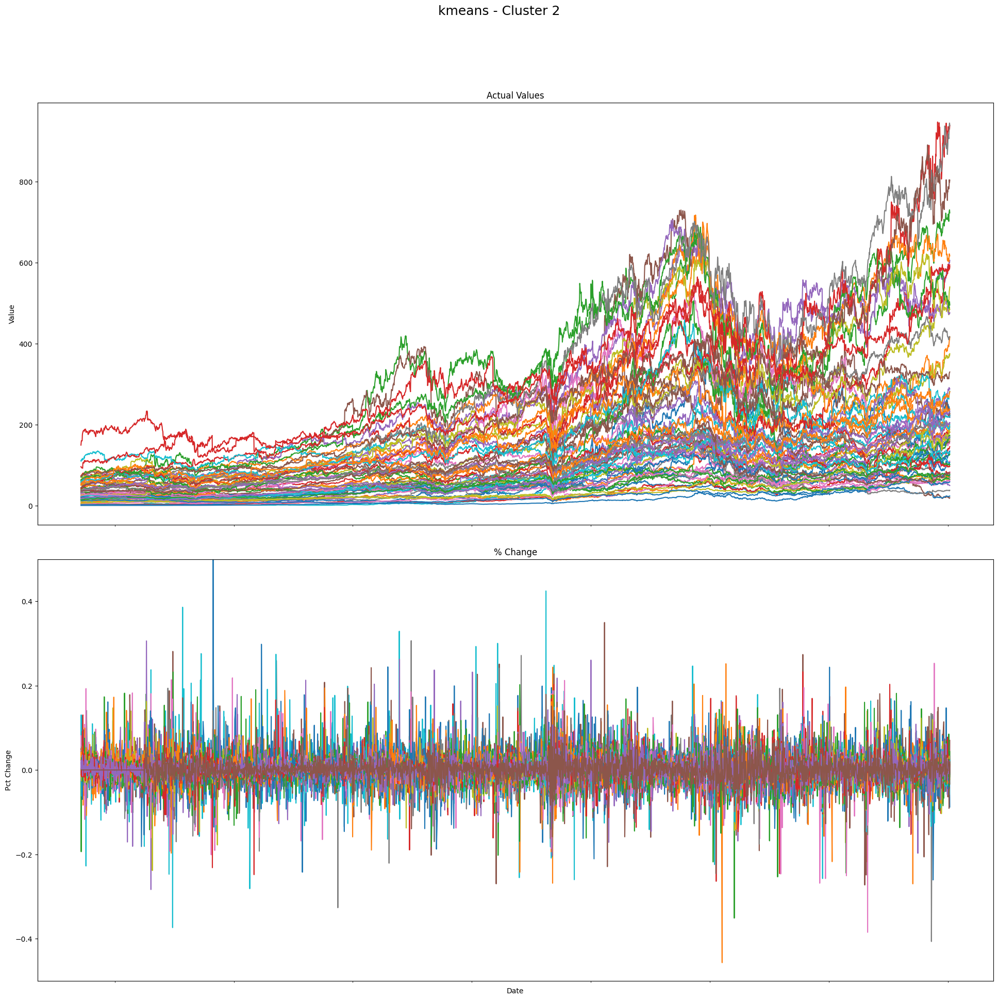

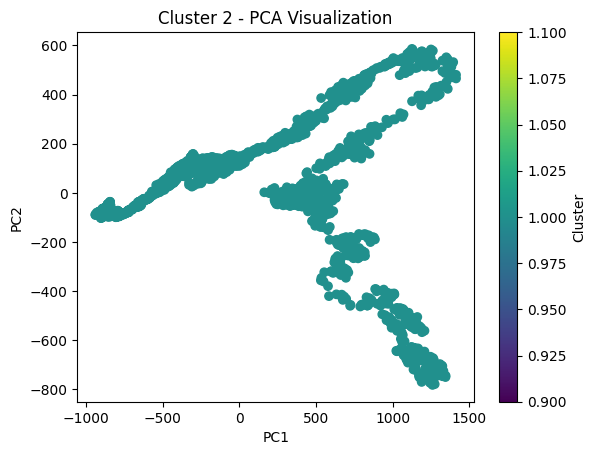

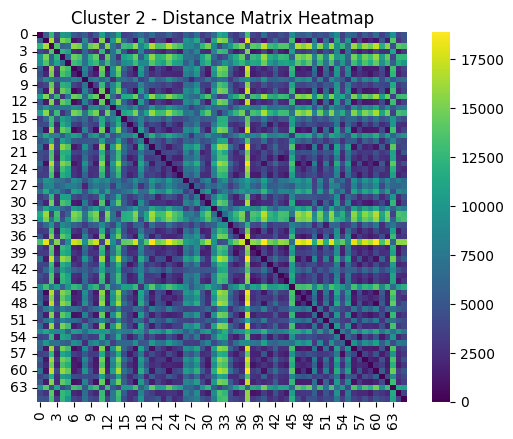

⚠️ DTW failed for cluster 2


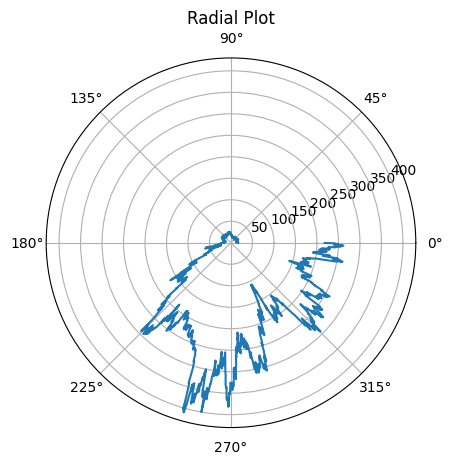

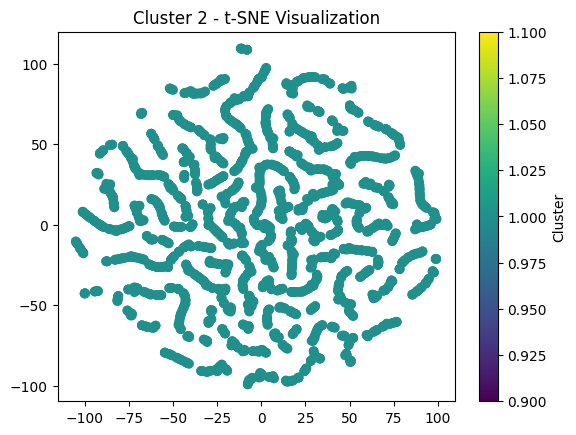

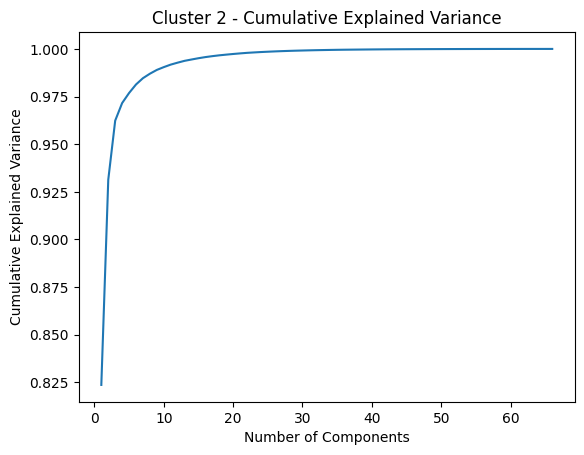

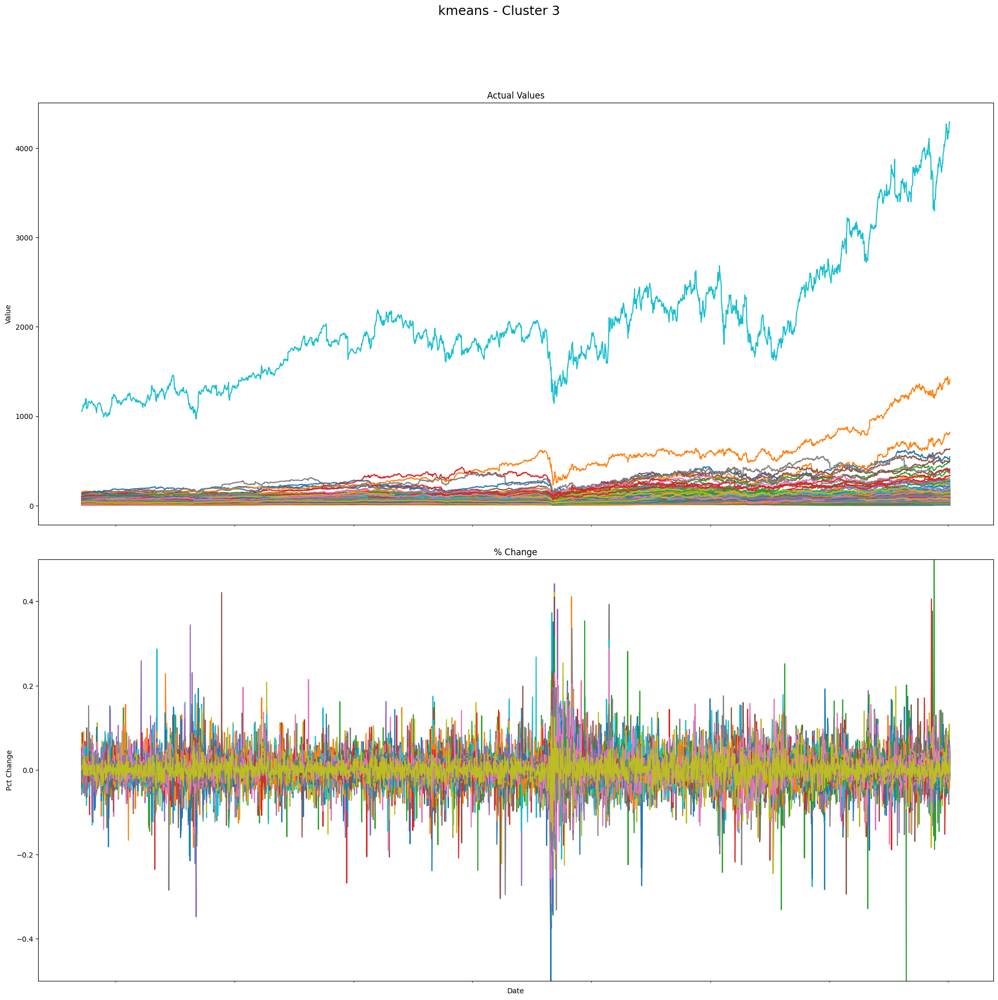

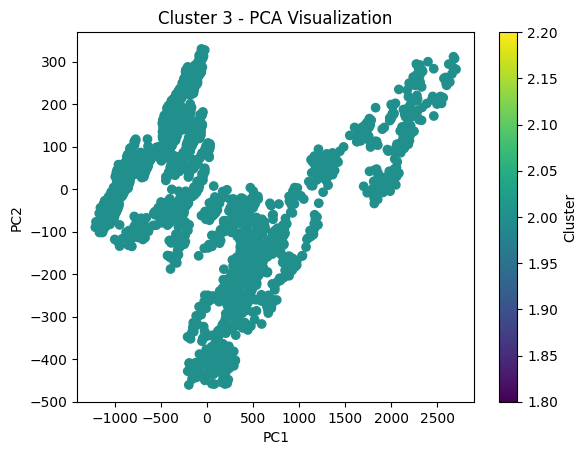

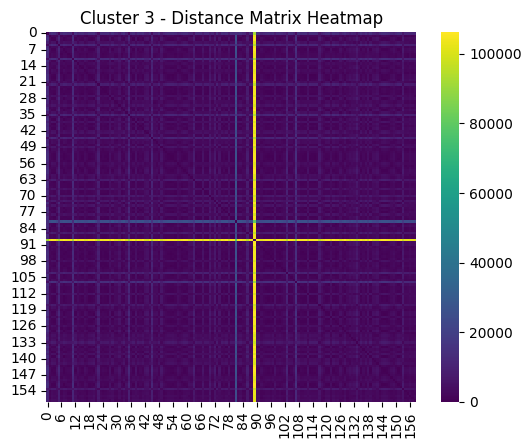

⚠️ DTW failed for cluster 3


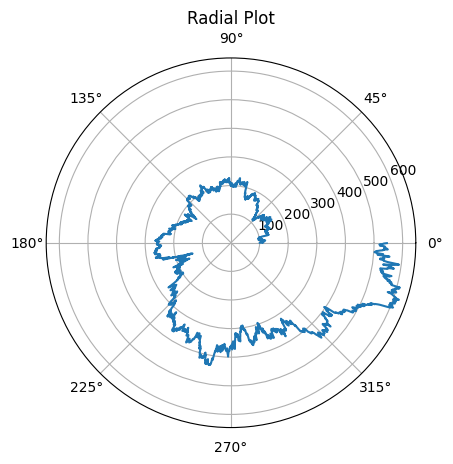

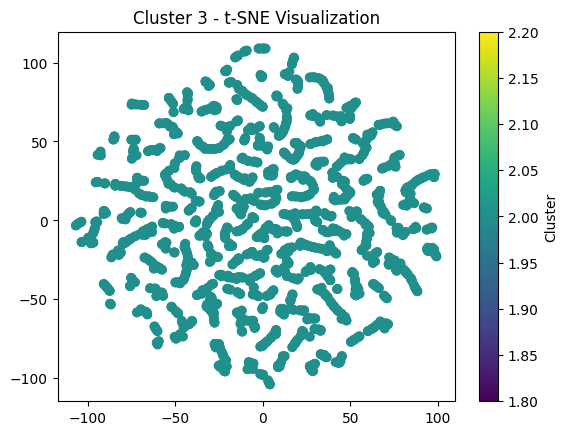

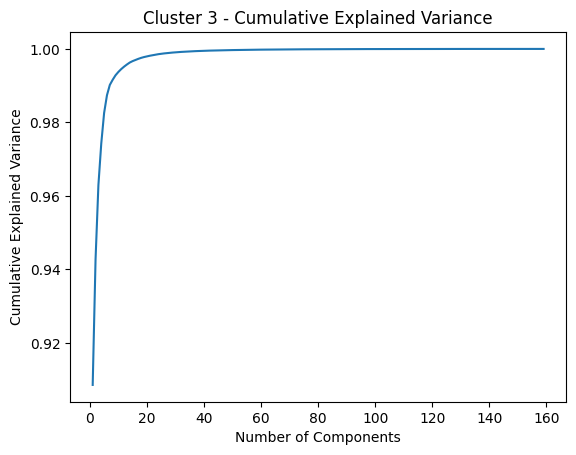

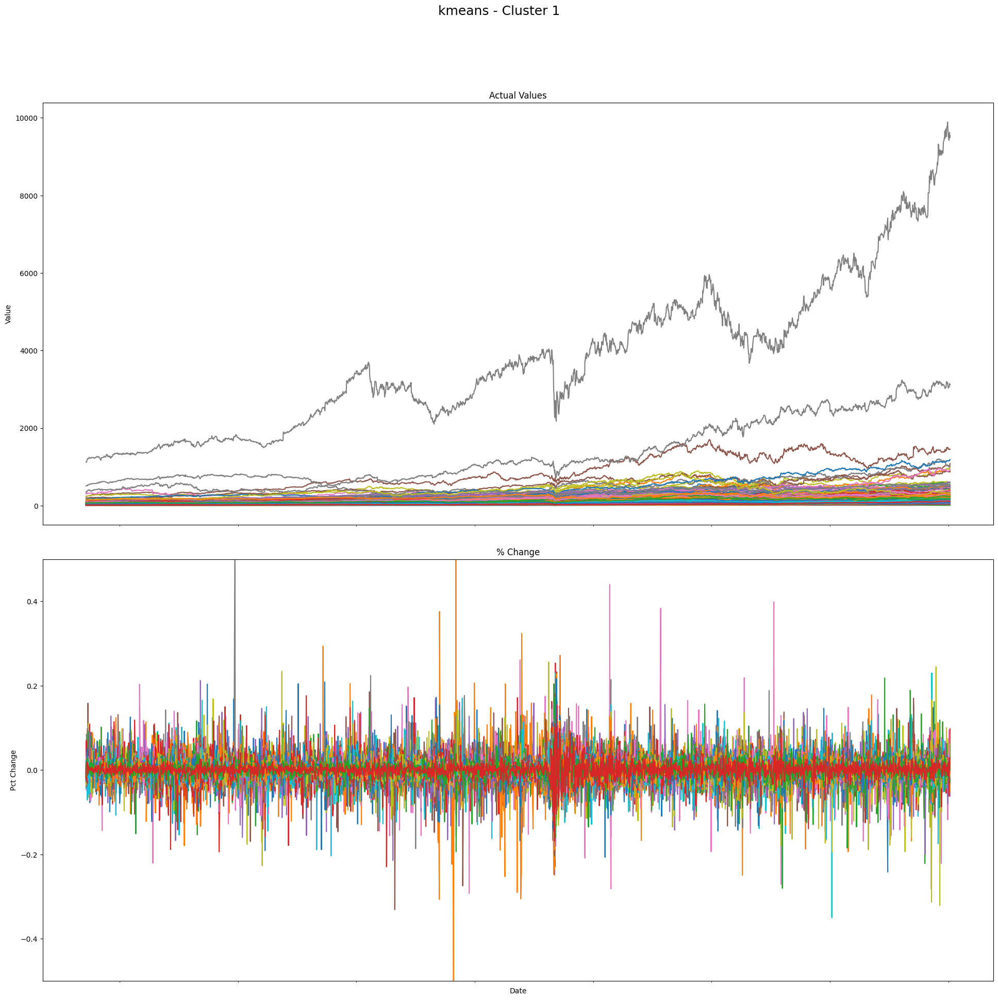

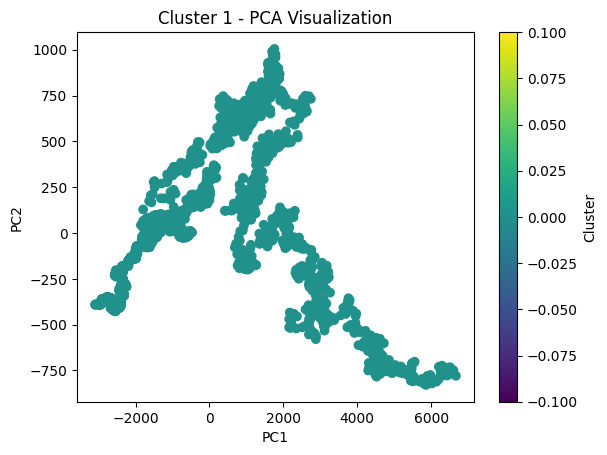

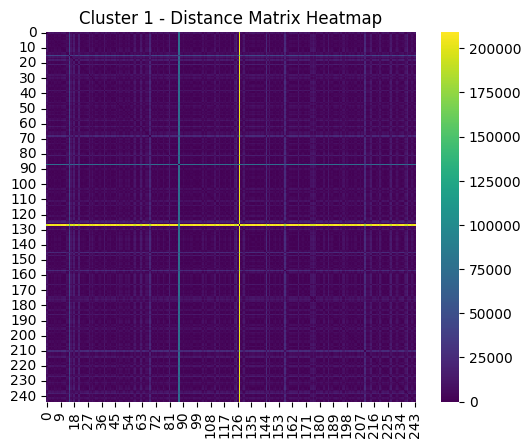

⚠️ DTW failed for cluster 1


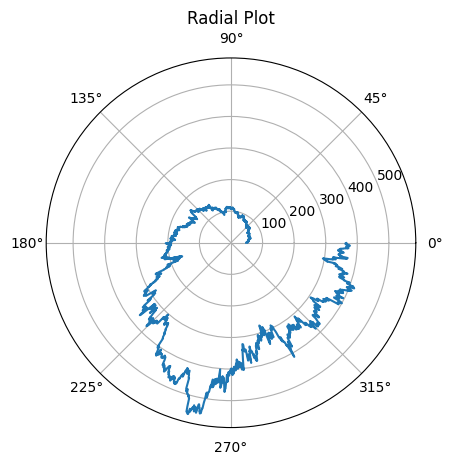

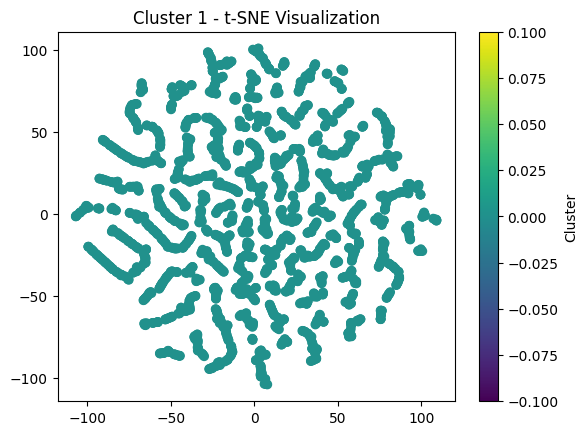

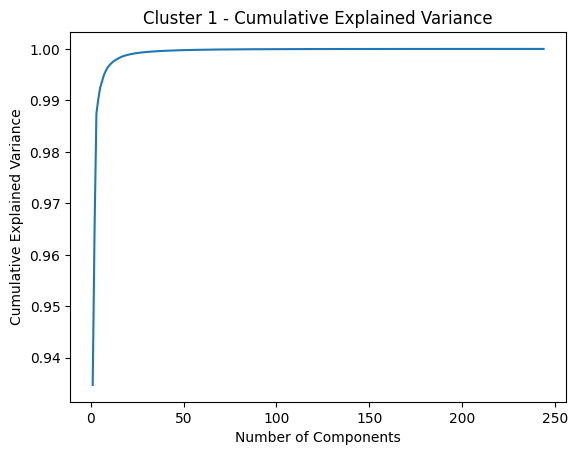

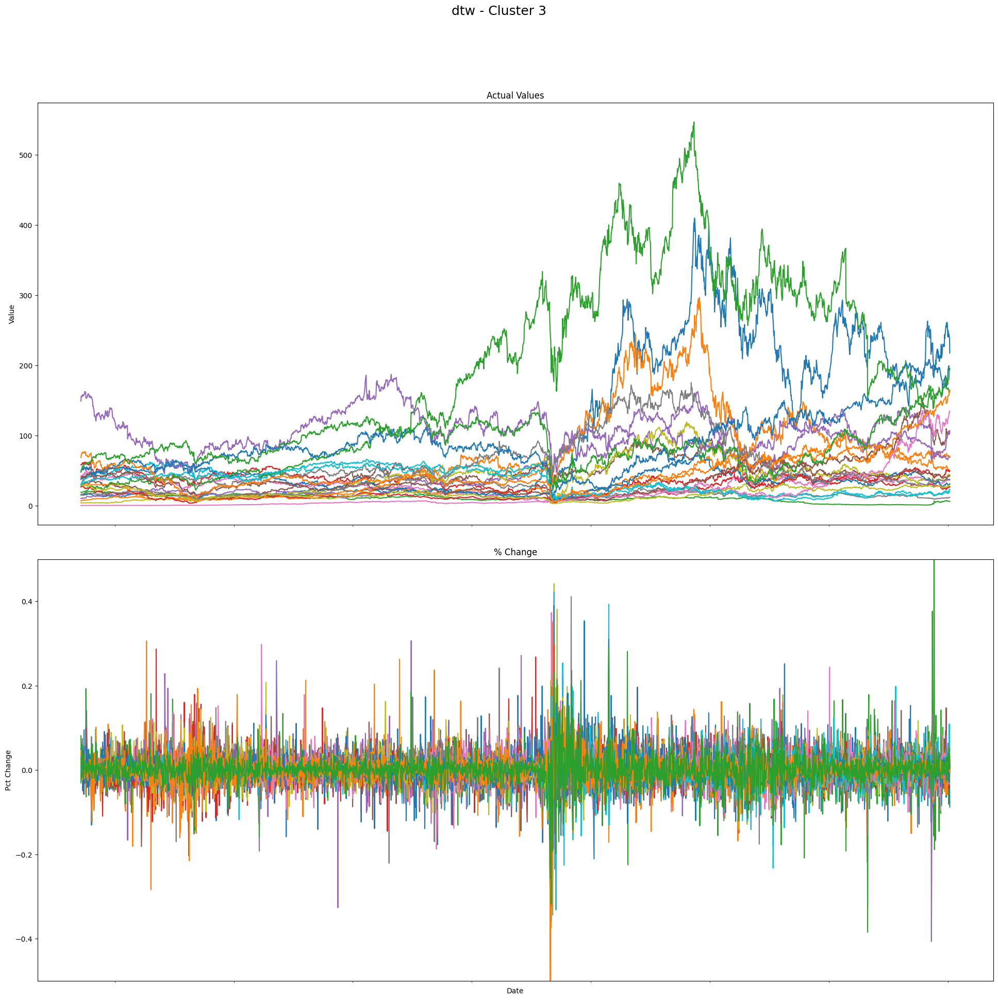

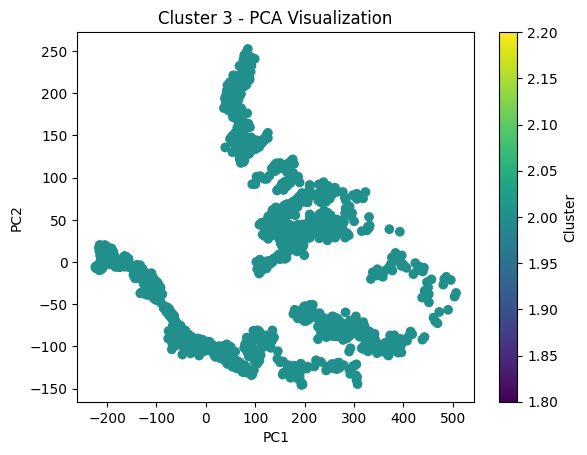

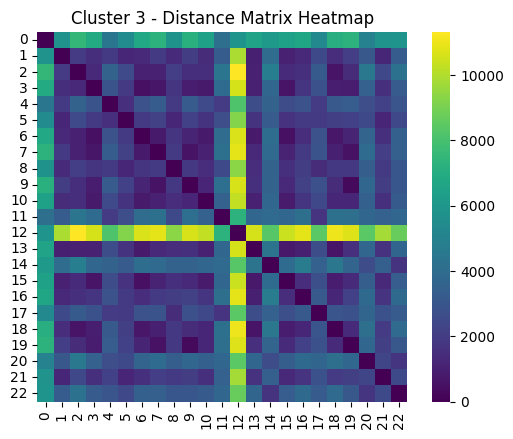

⚠️ DTW failed for cluster 3


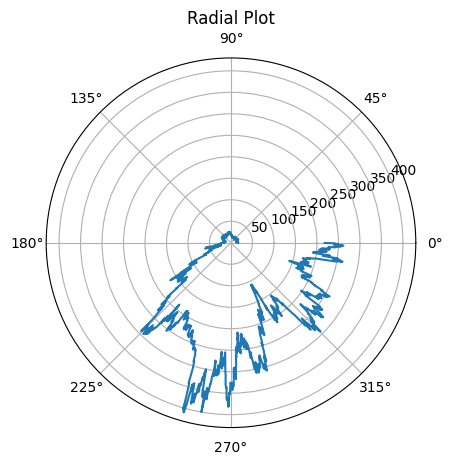

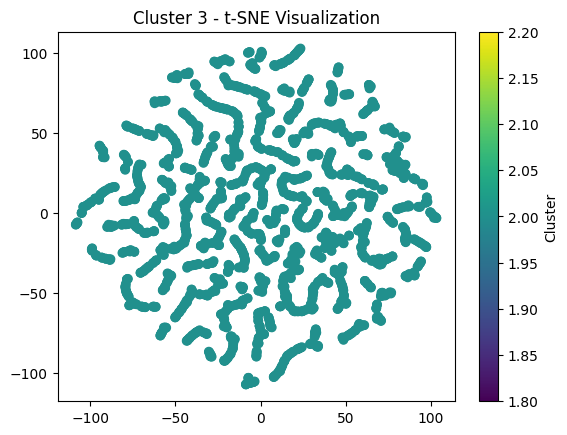

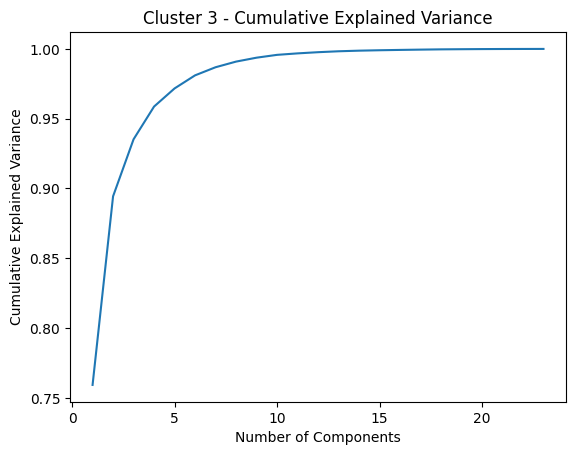

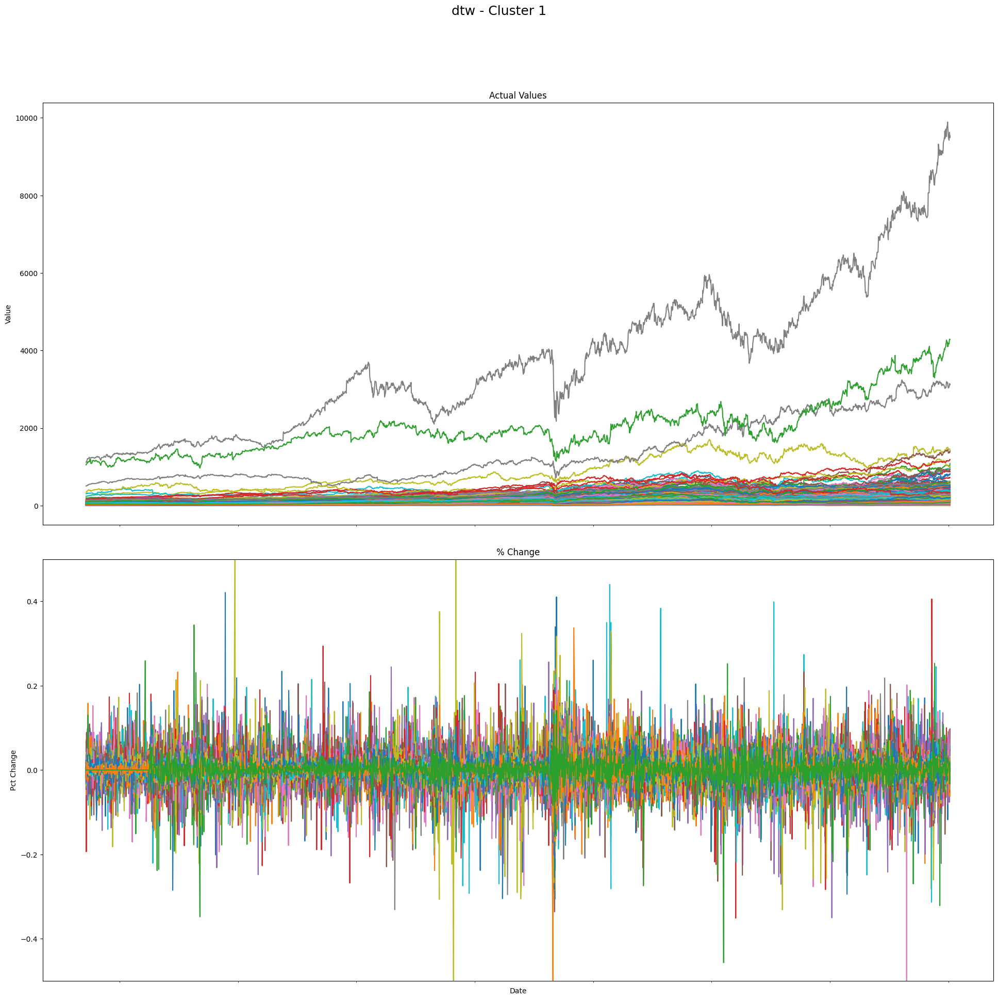

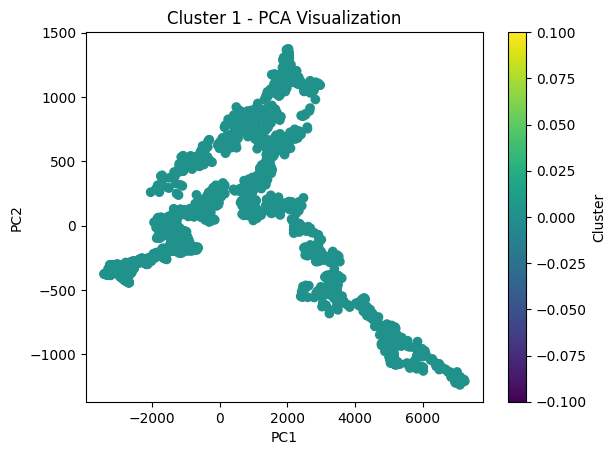

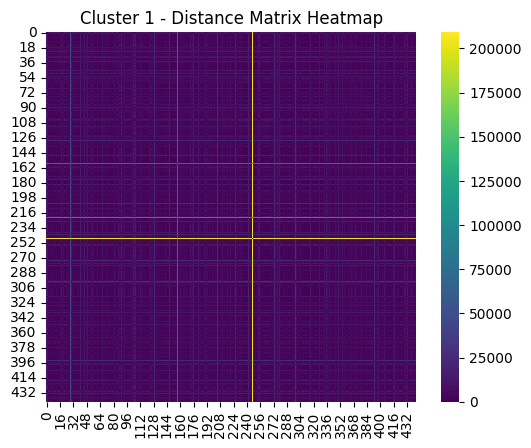

⚠️ DTW failed for cluster 1


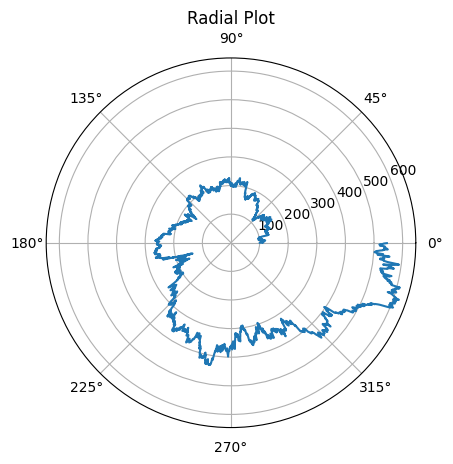

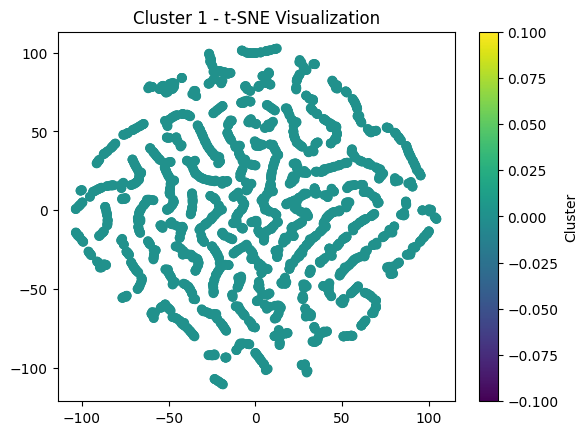

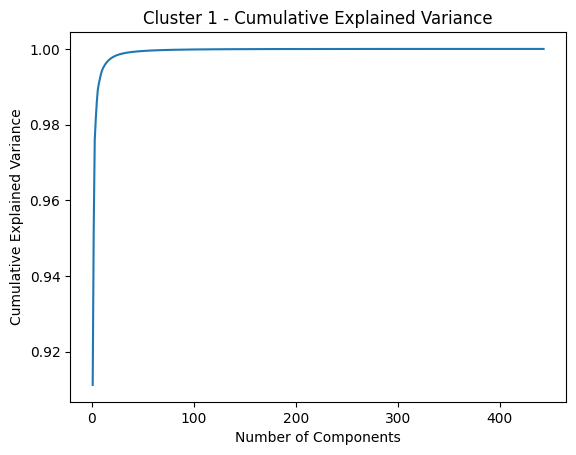

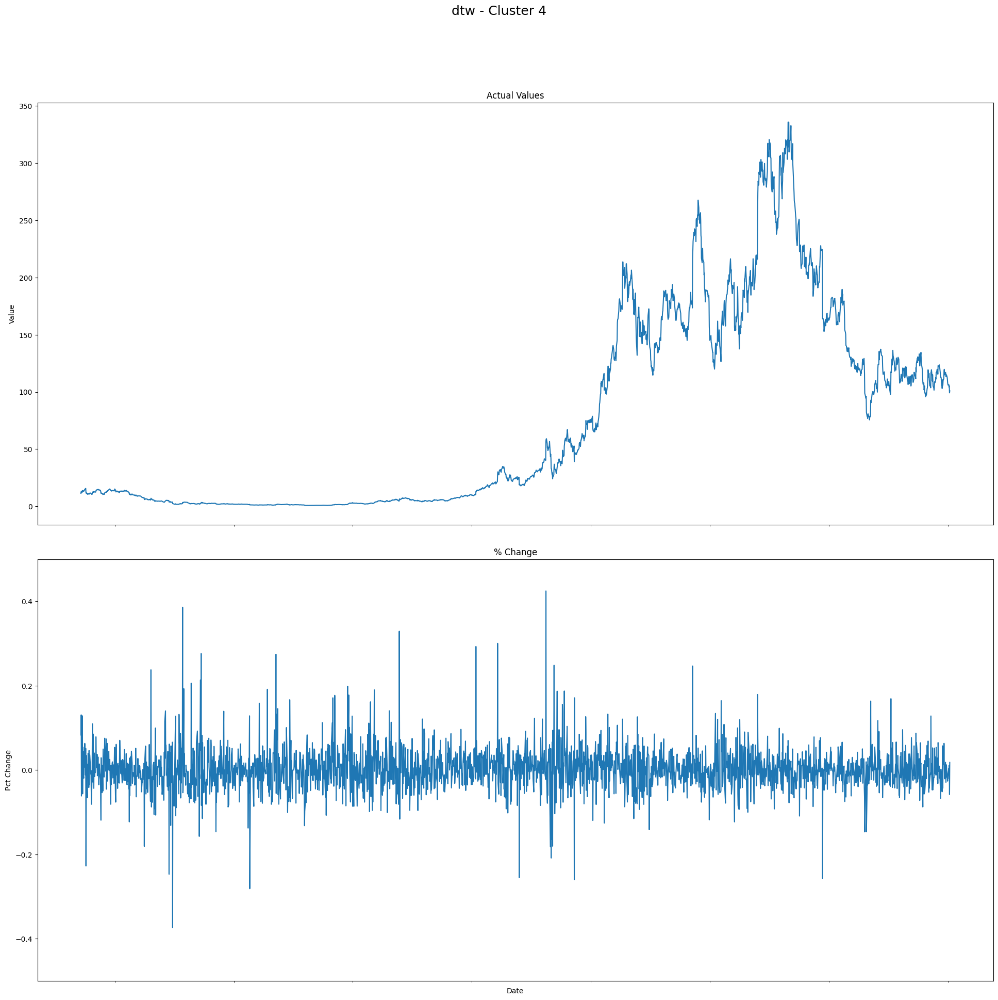

⚠️ PCA failed for cluster 4 due to insufficient data.


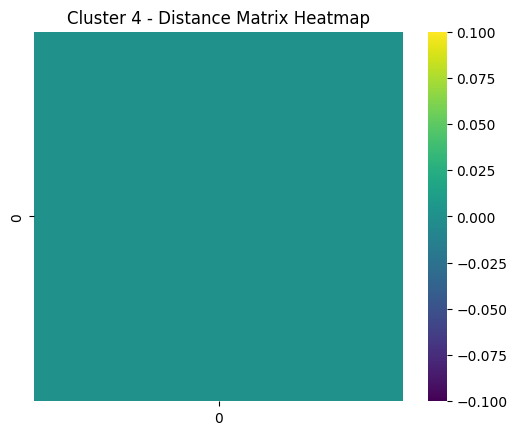

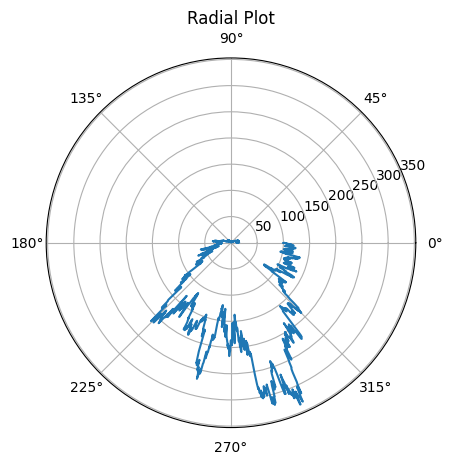

⚠️ t-SNE failed for cluster 4


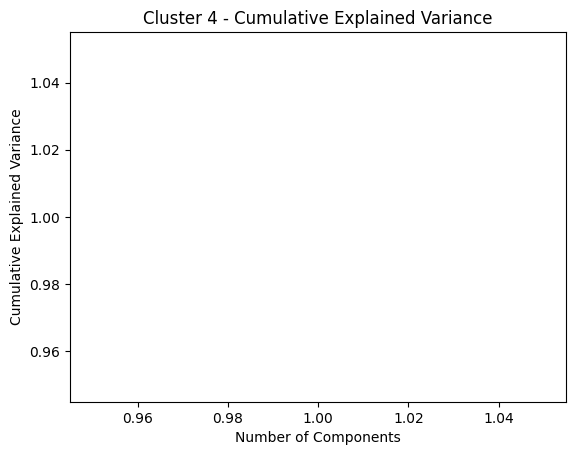

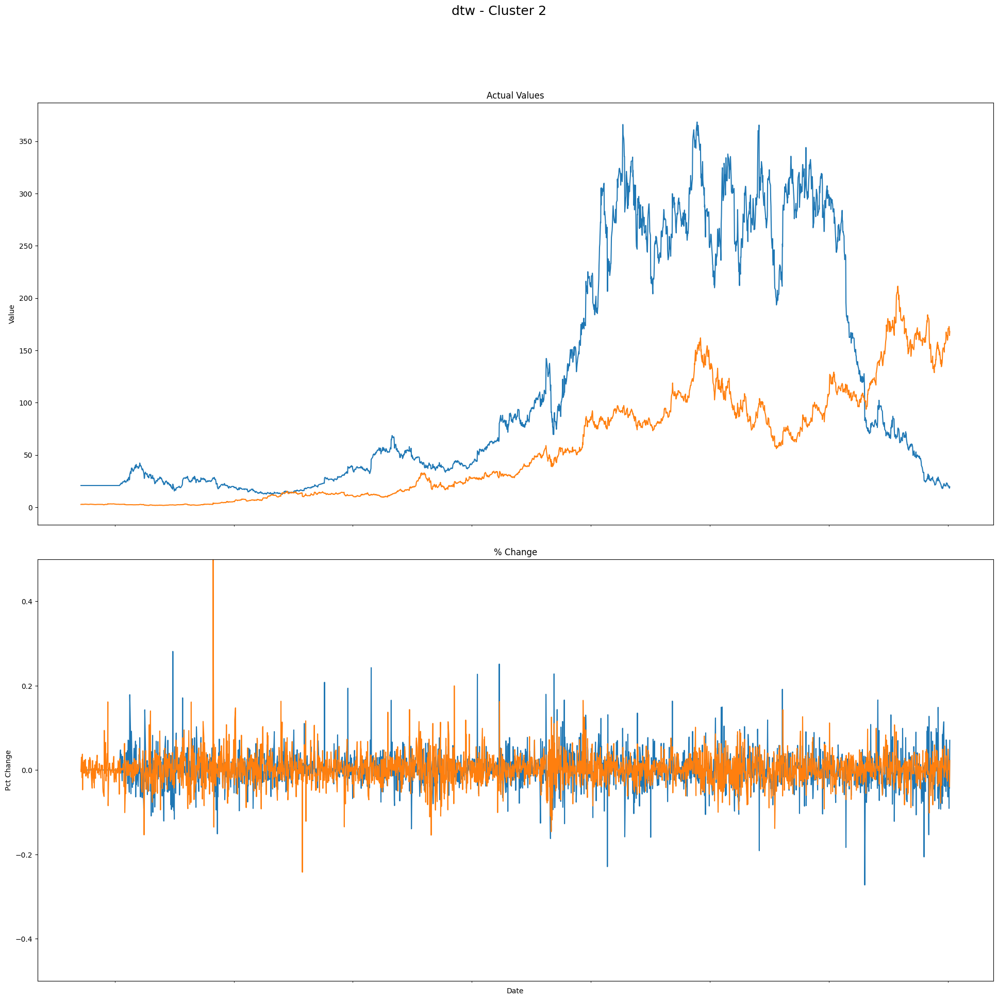

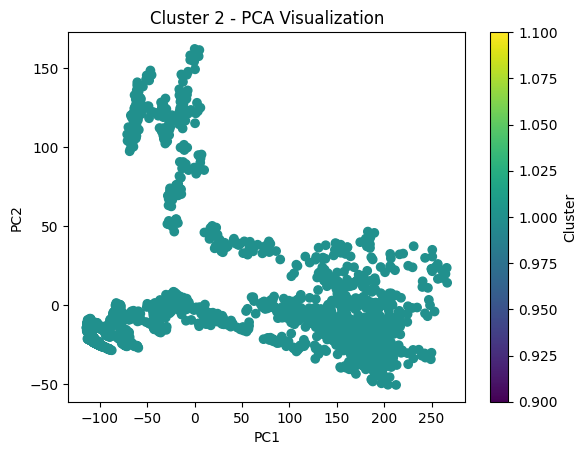

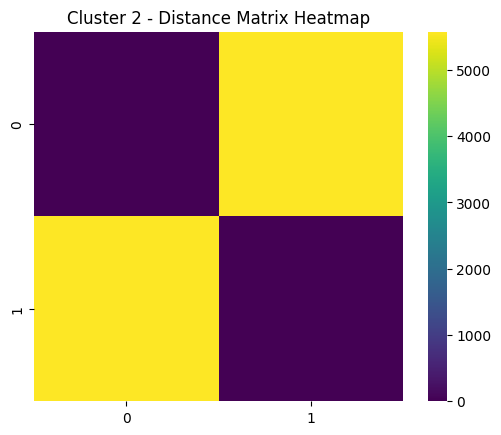

⚠️ DTW failed for cluster 2


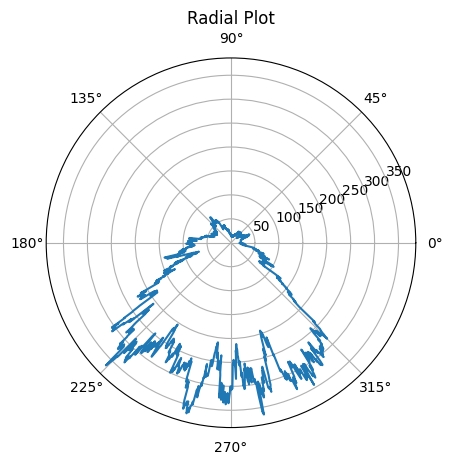

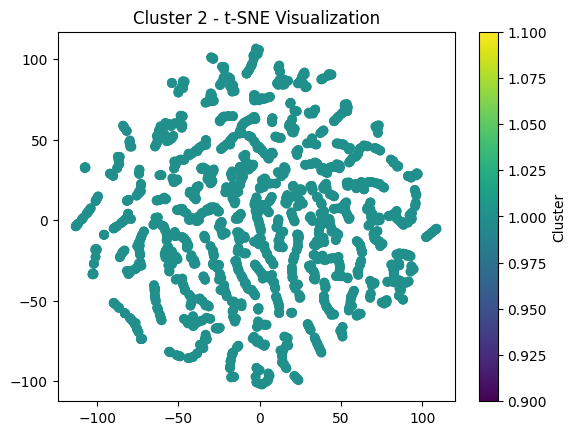

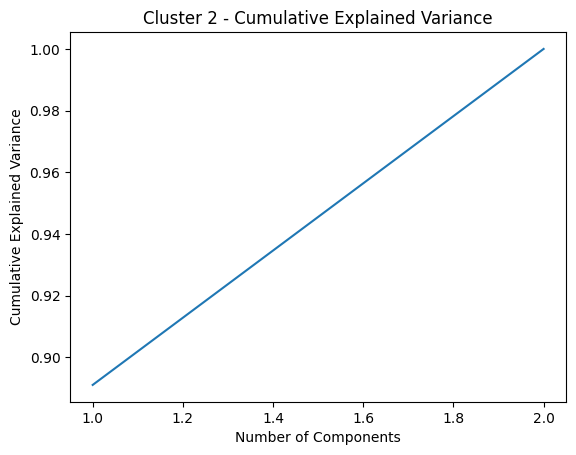

In [13]:
visualize_time_series_clusters(df_actual_new, df_pct, clustering_columns)


In [14]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns

def tsne_full_dataset_visualization(df_actual_new, clustering_cols, perplexity=50, random_state=42):
    """
    Run t-SNE on the full dataset and visualize clustering results for each clustering method.
    
    Parameters:
    - df_actual_new (pd.DataFrame): DataFrame containing actual values (tickers as rows).
    - clustering_cols (list): Names of columns with clustering labels (e.g., ['kmeans', 'dtw']).
    - perplexity (int): t-SNE perplexity (controls balance between local/global).
    - random_state (int): Seed for reproducibility.
    
    Returns:
    - None (displays scatter plots).
    """
    # Drop clustering columns to get only time series values
    X = df_actual_new.drop(columns=clustering_cols).values

    # Apply t-SNE
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=random_state)
    tsne_results = tsne.fit_transform(X)

    # Plot for each clustering method
    for col in clustering_cols:
        plt.figure(figsize=(10, 6))
        sns.scatterplot(
            x=tsne_results[:, 0], y=tsne_results[:, 1],
            hue=df_actual_new[col],
            palette="tab10",
            s=60
        )
        plt.title(f"t-SNE Visualization Colored by {col.upper()} Clusters", fontsize=14)
        plt.xlabel("t-SNE Dimension 1")
        plt.ylabel("t-SNE Dimension 2")
        plt.legend(title=col.upper(), bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()


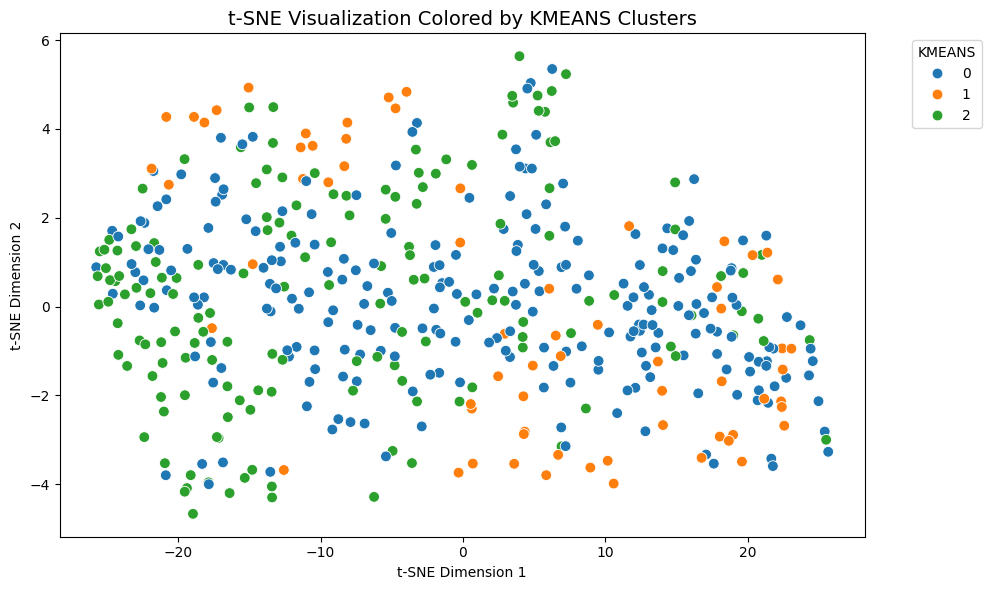

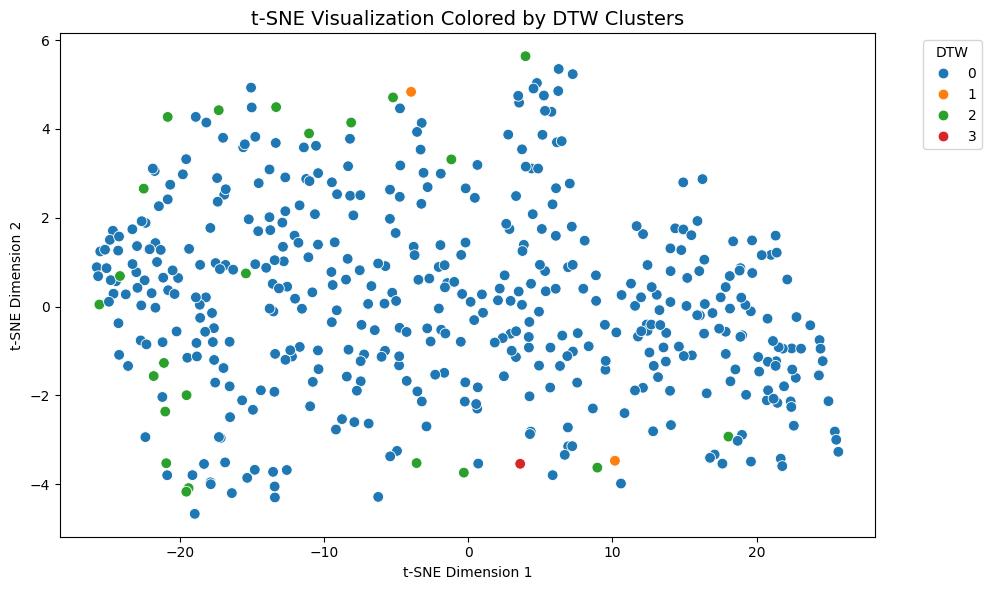

In [15]:
# Assuming 'df_actual_new' includes 'kmeans' and 'dtw' clustering columns:
tsne_full_dataset_visualization(df_actual_new, clustering_cols=['kmeans', 'dtw'])


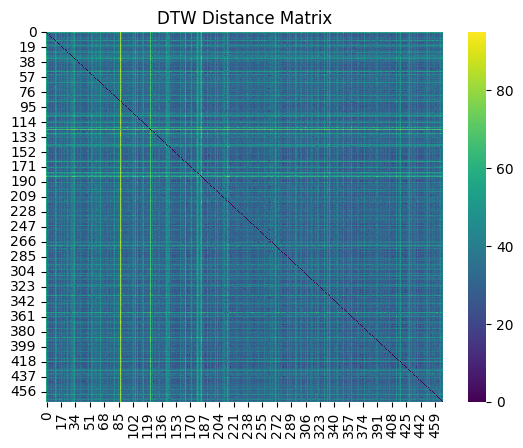

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(distance_matrix, cmap='viridis')
plt.title('DTW Distance Matrix')
plt.show()


# Get top-n representative stocks

In [17]:
def get_representative_assets(df_timeseries, cluster_labels, top_n):
    """
    Select the top_n assets closest to the centroid of each cluster and return a unique list.

    Args:
        df_timeseries (pd.DataFrame): Time series data with tickers as the index.
        cluster_labels (array-like): Vector of cluster labels (same order as df_timeseries).
        top_n (int): Number of assets to select per cluster.

    Returns:
        list: Unique list of selected representative tickers.
    """
    # Create a copy of the input DataFrame to avoid modifying the original
    df = df_timeseries.copy()
    
    # Add the cluster labels as a new column
    df['cluster'] = cluster_labels
    
    # Initialize an empty list to store representative tickers
    representatives = []

    # Iterate over each unique cluster
    for cluster_id in np.unique(cluster_labels):
        # Filter the DataFrame to include only rows belonging to the current cluster
        df_cluster = df[df['cluster'] == cluster_id].drop(columns='cluster')
        
        # Compute the centroid of the cluster (mean of all rows)
        centroid = df_cluster.mean(axis=0)
        
        # Calculate the distance of each row from the centroid
        distances = df_cluster.apply(lambda row: np.linalg.norm(row - centroid), axis=1)
        
        # Select the top_n assets with the smallest distances to the centroid
        top_assets = distances.nsmallest(top_n).index.tolist()
        
        # Add the selected assets to the final list
        representatives.extend(top_assets)

    # Return the unique list of representative tickers
    return representatives


In [18]:
# I decided to use the original values for the representative assets.


df_actual_no_labels = df_actual_new.drop(columns='dtw')
df_actual_no_labels = df_actual_no_labels.drop(columns='kmeans')

# Applica la funzione:
# Esempio: df_actual contiene le serie temporali, dtw_labels è il clustering
selected_stocks = get_representative_assets(df_actual, dtw_clusters, top_n=23)
print(len(selected_stocks))  # Stampa il numero totale di azioni selezionate





49


# Weight optimization onto representative stocks & comparison with benchmark

In [19]:
import numpy as np
import pandas as pd
import datetime
import matplotlib.pyplot as plt
import pandas_datareader.data as web
from pypfopt import expected_returns, risk_models, EfficientFrontier
import logging

# Configure logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger()

def get_sp500_data(mode: str, reference_df: pd.DataFrame, interval: str) -> pd.Series:
    """
    Fetches S&P 500 data from Stooq, either lookback or lookforward based on mode.

    Parameters:
        mode (str): 'lookback' or 'lookforward'
        reference_df (pd.DataFrame): Used to infer start/end date if needed
        interval (str): Time interval, e.g., '6m', '5y', '1y'

    Returns:
        pd.Series: Close prices of the S&P 500
    """
    try:
        ref_index = pd.to_datetime(reference_df.index)
        if mode == 'lookback':
            end_date = ref_index.max()
            logger.info(f"Using LOOKBACK mode ending at {end_date.date()}")
        elif mode == 'lookforward':
            start_date = ref_index.max()
            logger.info(f"Using LOOKFORWARD mode starting from {start_date.date()}")
        else:
            raise ValueError("Mode must be 'lookback' or 'lookforward'")

        # Parse interval
        num = int(interval[:-1])
        unit = interval[-1]
        if unit == 'd':
            delta = datetime.timedelta(days=num)
        elif unit == 'w':
            delta = datetime.timedelta(weeks=num)
        elif unit == 'm':
            delta = datetime.timedelta(days=30 * num)
        elif unit == 'y':
            delta = datetime.timedelta(days=365 * num)
        else:
            raise ValueError("Invalid time unit. Use 'd', 'w', 'm', or 'y'.")

        if mode == 'lookback':
            start_date = end_date - delta
        else:
            end_date = start_date + delta

        logger.info(f"Fetching S&P 500 data from {start_date.date()} to {end_date.date()} using Stooq...")
        sp500 = web.DataReader('^SPX', data_source='stooq', start=start_date, end=end_date)
        sp500 = sp500[::-1]  # Reverse to ascending order
        return sp500['Close']

    except Exception as e:
        logger.error(f"Failed to fetch S&P 500 data: {e}")
        raise


def calculate_annual_expected_returns(price_df: pd.DataFrame) -> pd.Series:
    """
    Calculate annualized expected returns from price data.

    Parameters:
        price_df (pd.DataFrame): DataFrame with historical price data

    Returns:
        pd.Series: Annualized expected returns for each asset
    """
    # Calculate daily returns
    daily_returns = price_df.pct_change().dropna()
    # Annualize returns (252 trading days in a year)
    annualized_returns = daily_returns.mean() * 252
    return annualized_returns


def calculate_annual_covariance_matrix(price_df: pd.DataFrame) -> pd.DataFrame:
    """
    Calculate the annualized covariance matrix from price data.

    Parameters:
        price_df (pd.DataFrame): DataFrame with historical price data

    Returns:
        pd.DataFrame: Annualized covariance matrix
    """
    daily_returns = price_df.pct_change().dropna()
    covariance_matrix = daily_returns.cov() * 252  # Annualize covariance
    return covariance_matrix


def optimize_min_variance_portfolio(expected_returns: pd.Series, cov_matrix: pd.DataFrame, target_return: float) -> pd.Series:
    """
    Optimize a minimum variance portfolio given expected returns and a covariance matrix.

    Parameters:
        expected_returns (pd.Series): Expected returns for each asset
        cov_matrix (pd.DataFrame): Covariance matrix of returns
        target_return (float): Target return to optimize for

    Returns:
        pd.Series: Optimal portfolio weights
    """
    n = len(expected_returns)
    tickers = expected_returns.index

    def objective(weights):
        return np.dot(weights.T, np.dot(cov_matrix, weights))

    constraints = [
        {'type': 'eq', 'fun': lambda w: np.sum(w) - 1},  # Weights sum to 1
        {'type': 'eq', 'fun': lambda w: np.dot(w, expected_returns) - target_return}  # Target return
    ]

    bounds = [(0, 1)] * n
    w0 = np.ones(n) / n  # Start with equal weights

    result = minimize(objective, w0, bounds=bounds, constraints=constraints)

    if not result.success:
        logger.error(f"Optimization failed: {result.message}")
        raise RuntimeError(f"Optimization failed: {result.message}")

    return pd.Series(result.x, index=tickers)


def plot_results(sp500_data: pd.Series, portfolio_returns: pd.Series):
    """
    Plot the performance of the optimized portfolio vs. S&P 500.

    Parameters:
        sp500_data (pd.Series): S&P 500 data
        portfolio_returns (pd.Series): Portfolio returns
    """
    sp500_normalized = sp500_data / sp500_data.iloc[0]
    portfolio_cumulative = (1 + portfolio_returns).cumprod()

    sp500_returns = sp500_data.pct_change().dropna()
    sp500_annual_ret = sp500_returns.mean() * 252
    sp500_annual_vol = sp500_returns.std() * np.sqrt(252)
    sp500_sharpe = sp500_annual_ret / sp500_annual_vol

    port_annual_ret = portfolio_returns.mean() * 252
    port_annual_vol = portfolio_returns.std() * np.sqrt(252)
    port_sharpe = port_annual_ret / port_annual_vol

    plt.figure(figsize=(12, 7))
    plt.plot(sp500_normalized, label='S&P 500', color='blue')
    plt.plot(portfolio_cumulative, label='Optimized Portfolio', color='green')

    plt.title("Performance: Optimized Portfolio vs S&P 500 (Normalized)", fontsize=14)
    plt.xlabel("Date")
    plt.ylabel("Growth of $1")
    plt.legend()
    plt.grid(True)

    textstr = '\n'.join((f"Portfolio:",
                         f"  Return:  {port_annual_ret:.2%}",
                         f"  Volatility: {port_annual_vol:.2%}",
                         f"  Sharpe Ratio: {port_sharpe:.2f}",
                         "",
                         f"S&P 500:",
                         f"  Return:  {sp500_annual_ret:.2%}",
                         f"  Volatility: {sp500_annual_vol:.2%}",
                         f"  Sharpe Ratio: {sp500_sharpe:.2f}"))

    props = dict(boxstyle='round', facecolor='whitesmoke', alpha=0.9)
    plt.gca().text(0.02, 0.98, textstr, transform=plt.gca().transAxes, fontsize=10,
                   verticalalignment='top', bbox=props)

    plt.tight_layout()
    plt.show()

def main(historical_prices, selected_stocks, mode='lookback', interval='6m'):
    try:
        logger.info("Preparing data for optimization...")

        # Check if all selected stocks exist in the DataFrame columns
        missing_stocks = [stock for stock in selected_stocks if stock not in historical_prices.columns]
        if missing_stocks:
            raise ValueError(f"Missing stocks in data: {', '.join(missing_stocks)}")

        # Filter and prepare prices
        prices = historical_prices[selected_stocks].dropna(axis=0, how='any')
        logger.info("Calculating expected returns and covariance matrix...")

        # Estimate expected returns and sample covariance matrix
        mu = expected_returns.mean_historical_return(prices)
        S = risk_models.sample_cov(prices)

        if mode == 'lookback':
            logger.info("Running in lookback mode...")

            # Fetch historical S&P 500 data
            sp500_close = get_sp500_data(mode='lookback', reference_df=historical_prices, interval=interval)
            sp500_return = (sp500_close.pct_change().dropna() + 1).prod() ** (1 / (len(sp500_close) / 252)) - 1

            logger.info(f"Target S&P 500 annual return (lookback): {sp500_return:.4f}")

            # Solve for optimal weights
            ef = EfficientFrontier(mu, S)
            ef.efficient_return(target_return=sp500_return)
            optimal_weights = ef.clean_weights()
            logger.info("Optimal Portfolio Weights (lookback):")
            logger.info(optimal_weights)

            # Compute portfolio returns
            daily_returns = prices.pct_change().dropna()
            optimal_weights_series = pd.Series(optimal_weights).reindex(daily_returns.columns).fillna(0)
            portfolio_returns = daily_returns @ optimal_weights_series

            # Align and plot results
            sp500_close.index = pd.to_datetime(sp500_close.index).tz_localize(None)
            portfolio_returns.index = pd.to_datetime(portfolio_returns.index).tz_localize(None)
            common_dates = sp500_close.index.intersection(portfolio_returns.index)

            plot_results(sp500_close.loc[common_dates], portfolio_returns.loc[common_dates])

        elif mode == 'lookforward':
            logger.info("Running in lookforward mode...")

            # Get last date from historical prices for lookforward
            last_date = historical_prices.index.max()

            # Parse interval to get date range
            num = int(interval[:-1])
            unit = interval[-1]
            if unit == 'd':
                delta = datetime.timedelta(days=num)
            elif unit == 'w':
                delta = datetime.timedelta(weeks=num)
            elif unit == 'm':
                delta = datetime.timedelta(days=30 * num)
            elif unit == 'y':
                delta = datetime.timedelta(days=365 * num)
            else:
                raise ValueError("Invalid interval format.")

            # Set the start and end dates for lookforward
            start_date = last_date + pd.Timedelta(days=1)
            end_date = start_date + delta

            logger.info(f"Fetching lookforward data from {start_date.date()} to {end_date.date()}")

            # Fetch future S&P 500 data (for forecast period)
            sp500 = web.DataReader('^SPX', data_source='stooq', start=start_date, end=end_date)[::-1]
            sp500_close = sp500['Close'].copy()

            # Fetch future stock prices
            future_prices = {}
            for ticker in selected_stocks:
                try:
                    df = web.DataReader(ticker, data_source='stooq', start=start_date, end=end_date)[::-1]
                    future_prices[ticker] = df['Close']
                except Exception as e:
                    logger.warning(f"Could not fetch future data for {ticker}: {e}")

            # Create DataFrame of future stock prices
            future_prices_df = pd.DataFrame(future_prices).dropna()

            # Apply optimized weights to the future data
            ef = EfficientFrontier(mu, S)
            sp500_return = (sp500_close.pct_change().dropna() + 1).prod() ** (1 / (len(sp500_close) / 252)) - 1
            ef.efficient_return(target_return=sp500_return)
            optimal_weights = ef.clean_weights()
            logger.info("Optimal Portfolio Weights (lookforward):")
            logger.info(optimal_weights)

            # Compute portfolio returns using future prices
            daily_returns = future_prices_df.pct_change().dropna()
            optimal_weights_series = pd.Series(optimal_weights).reindex(daily_returns.columns).fillna(0)
            portfolio_returns = daily_returns @ optimal_weights_series

            # Align and plot results
            sp500_close.index = pd.to_datetime(sp500_close.index).tz_localize(None)
            portfolio_returns.index = pd.to_datetime(portfolio_returns.index).tz_localize(None)
            common_dates = sp500_close.index.intersection(portfolio_returns.index)

            plot_results(sp500_close.loc[common_dates], portfolio_returns.loc[common_dates])

        else:
            raise ValueError("Mode must be 'lookback' or 'lookforward'.")

    except Exception as e:
        logger.error(f"Critical error in main workflow: {e}")
        raise e



## Looking forward (next 2 months)

2025-04-17 22:34:15,625 - INFO - Preparing data for optimization...
2025-04-17 22:34:15,651 - INFO - Calculating expected returns and covariance matrix...
2025-04-17 22:34:15,667 - INFO - Running in lookforward mode...
2025-04-17 22:34:15,668 - INFO - Fetching lookforward data from 2024-10-12 to 2025-04-10
2025-04-17 22:34:23,068 - WARNING - Could not fetch future data for MRO: 'Close'
2025-04-17 22:34:24,392 - INFO - Optimal Portfolio Weights (lookforward):
2025-04-17 22:34:24,393 - INFO - OrderedDict({'AVY': 0.0, 'JBHT': 0.0215, 'ADI': 0.0, 'BR': 0.00271, 'AXP': 0.0, 'PEP': 0.17838, 'TXN': 0.0, 'TRV': 0.0, 'NXPI': 0.0, 'MAR': 0.01936, 'MMC': 0.03531, 'WM': 0.18649, 'AIZ': 0.03723, 'ZTS': 0.0, 'JNJ': 0.29948, 'LOW': 0.0, 'JKHY': 0.08904, 'VMC': 0.02086, 'CDW': 0.0, 'UPS': 0.04044, 'PNC': 0.0, 'JPM': 0.0, 'CME': 0.03995, 'SEDG': 0.0, 'AMD': 0.0, 'MU': 0.0, 'CZR': 0.0, 'ON': 0.0, 'TRGP': 0.0, 'BBWI': 0.0, 'DVN': 0.0, 'DXCM': 0.00546, 'FCX': 0.0, 'APA': 0.0, 'MTCH': 0.00618, 'EQT': 0.015

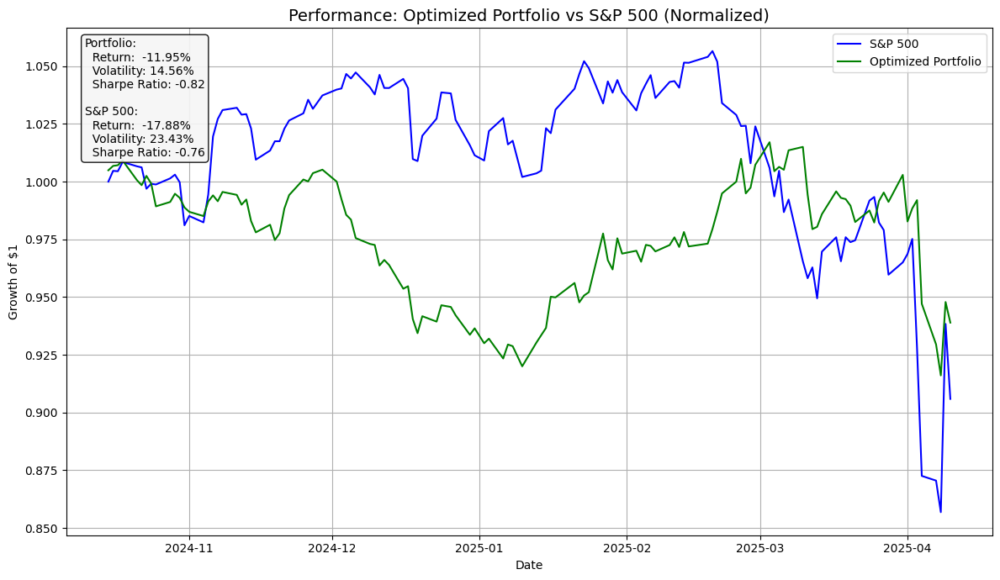

In [20]:

main(
        historical_prices=df_sp500,
        selected_stocks= selected_stocks,
        mode='lookforward',
        interval='6m'
    )

## Looking backwards (past timewindow used for clustering)

2025-04-17 22:34:24,634 - INFO - Preparing data for optimization...
2025-04-17 22:34:24,634 - INFO - Calculating expected returns and covariance matrix...
2025-04-17 22:34:24,651 - INFO - Running in lookback mode...
2025-04-17 22:34:24,651 - INFO - Using LOOKBACK mode ending at 2024-10-11
2025-04-17 22:34:24,651 - INFO - Fetching S&P 500 data from 2014-10-14 to 2024-10-11 using Stooq...
2025-04-17 22:34:24,946 - INFO - Target S&P 500 annual return (lookback): 0.1199
2025-04-17 22:34:24,964 - INFO - Optimal Portfolio Weights (lookback):
2025-04-17 22:34:24,965 - INFO - OrderedDict({'AVY': 0.0, 'JBHT': 0.0215, 'ADI': 0.0, 'BR': 0.00271, 'AXP': 0.0, 'PEP': 0.17838, 'TXN': 0.0, 'TRV': 0.0, 'NXPI': 0.0, 'MAR': 0.01936, 'MMC': 0.03531, 'WM': 0.18649, 'AIZ': 0.03723, 'ZTS': 0.0, 'JNJ': 0.29948, 'LOW': 0.0, 'JKHY': 0.08904, 'VMC': 0.02086, 'CDW': 0.0, 'UPS': 0.04044, 'PNC': 0.0, 'JPM': 0.0, 'CME': 0.03995, 'SEDG': 0.0, 'AMD': 0.0, 'MU': 0.0, 'CZR': 0.0, 'ON': 0.0, 'TRGP': 0.0, 'BBWI': 0.0, 'DV

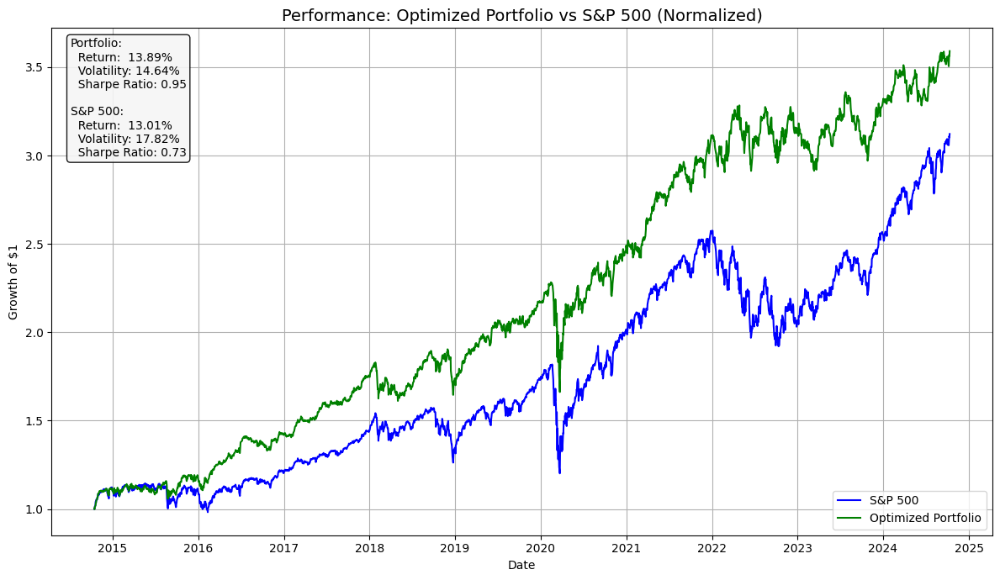

In [21]:
main(
        historical_prices=df_sp500,
        selected_stocks= selected_stocks,
        mode='lookback',
        interval='10y'
    )
